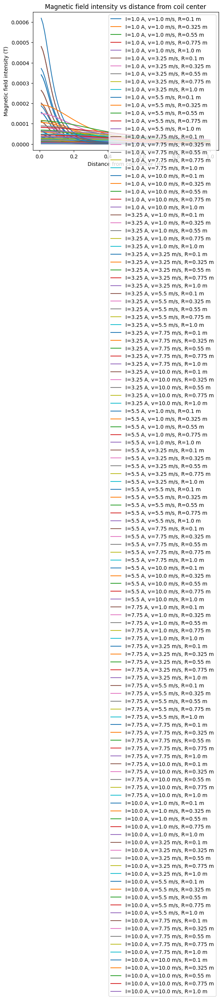

In [1]:
import numpy as np
import matplotlib.pyplot as plt


# Define the magnetic_field_intensity function
def magnetic_field_intensity(I, v, R, r):
    mu_0 = 4 * np.pi * 10**-7
    B = (mu_0 * I * v * R**2) / (2 * (R**2 + r**2) ** (3 / 2))
    return B


# Define lists of parameter values
I_values = np.linspace(1, 10, 5)  # Current values in Amperes
v_values = np.linspace(1, 10, 5)  # Magnet speed values in meters per second
R_values = np.linspace(0.1, 1, 5)  # Coil radius values in meters
r_values = np.linspace(0.01, 1, 100)  # Distance from coil center values in meters

# Create a figure and axis
fig, ax = plt.subplots()

# Use nested loops to compute and plot the magnetic field intensity for each combination of parameter values
for I in I_values:
    for v in v_values:
        for R in R_values:
            B_values = [magnetic_field_intensity(I, v, R, r) for r in r_values]
            ax.plot(r_values, B_values, label=f"I={I} A, v={v} m/s, R={R} m")

# Set labels and title
ax.set_xlabel("Distance from coil center (m)")
ax.set_ylabel("Magnetic field intensity (T)")
ax.set_title("Magnetic field intensity vs distance from coil center")
ax.legend()

# Show the plot
plt.show()

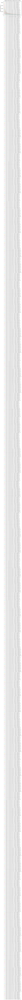

In [2]:
import numpy as np
import matplotlib.pyplot as plt


# Define the magnetic_field_intensity function
def magnetic_field_intensity(I, v, R, r):
    mu_0 = 4 * np.pi * 10**-7
    B = (mu_0 * I * v * R**2) / (2 * (R**2 + r**2) ** (3 / 2))
    return B


# Define a function to model the effect of temperature on conductivity
def conductivity(temperature, material):
    if material == "copper":
        return 59.6e7 / (1 + 0.017 * (temperature - 20))
    elif material == "aluminum":
        return 35.4e7 / (1 + 0.025 * (temperature - 20))
    else:
        raise ValueError("Unsupported material")


# Define lists of parameter values
I_values = np.linspace(1, 10, 5)  # Current values in Amperes
v_values = np.linspace(1, 10, 5)  # Magnet speed values in meters per second
R_values = np.linspace(0.1, 1, 5)  # Coil radius values in meters
r_values = np.linspace(0.01, 1, 100)  # Distance from coil center values in meters
temperature_values = np.linspace(20, 100, 5)  # Temperature values in Celsius
coil_types = ["circular", "triangular"]  # Coil types

# Create a figure and axis
fig, ax = plt.subplots()

# Use nested loops to compute and plot the magnetic field intensity for each combination of parameter values
for I in I_values:
    for v in v_values:
        for R in R_values:
            for temperature in temperature_values:
                for coil_type in coil_types:
                    if coil_type == "circular":
                        effective_R = R
                    elif coil_type == "triangular":
                        effective_R = R * np.sqrt(3) / 2
                    conductivity_value = conductivity(temperature, "copper")
                    I_effective = I * conductivity_value
                    B_values = [
                        magnetic_field_intensity(I_effective, v, effective_R, r)
                        for r in r_values
                    ]
                    ax.plot(
                        r_values,
                        B_values,
                        label=f"I={I} A, v={v} m/s, R={R} m, T={temperature}°C, {coil_type} coil",
                    )

# Set labels and title
ax.set_xlabel("Distance from coil center (m)")
ax.set_ylabel("Magnetic field intensity (T)")
ax.set_title("Magnetic field intensity vs distance from coil center")
ax.legend()

# Show the plot
plt.show()

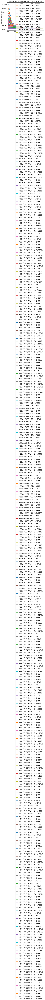

Effective radius for triangular coil: 0.22 m


In [3]:
import numpy as np
import matplotlib.pyplot as plt


# Define the magnetic_field_intensity function
def magnetic_field_intensity(I, v, R, r, T):
    mu_0 = 4 * np.pi * 10**-7
    # Calculate conductivity based on temperature (assuming a simple linear relationship)
    sigma = 1 / (
        1 + 0.01 * (T - 20)
    )  # Conductivity decreases with increasing temperature
    B = (mu_0 * I * v * R**2 * sigma) / (2 * (R**2 + r**2) ** (3 / 2))
    return B


# Define lists of parameter values
I_values = np.linspace(1, 10, 5)  # Current values in Amperes
v_values = np.linspace(1, 10, 5)  # Magnet speed values in meters per second
R_values = np.linspace(0.1, 1, 5)  # Coil radius values in meters
r_values = np.linspace(0.01, 1, 100)  # Distance from coil center values in meters
T_values = np.linspace(20, 100, 5)  # Temperature values in degrees Celsius

# Create a figure and axis
fig, ax = plt.subplots()

# Use nested loops to compute and plot the magnetic field intensity for each combination of parameter values
for I in I_values:
    for v in v_values:
        for R in R_values:
            for T in T_values:
                B_values = [magnetic_field_intensity(I, v, R, r, T) for r in r_values]
                ax.plot(
                    r_values, B_values, label=f"I={I} A, v={v} m/s, R={R} m, T={T}°C"
                )

# Set labels and title
ax.set_xlabel("Distance from coil center (m)")
ax.set_ylabel("Magnetic field intensity (T)")
ax.set_title("Magnetic field intensity vs distance from coil center")
ax.legend()

# Show the plot
plt.show()


# Define a function to calculate the effective radius for a triangular coil
def triangular_coil_radius(a, b, c):
    # Calculate the semi-perimeter
    s = (a + b + c) / 2
    # Calculate the area using Heron's formula
    area = np.sqrt(s * (s - a) * (s - b) * (s - c))
    # Calculate the effective radius
    R_eff = np.sqrt(area / np.pi)
    return R_eff


# Example usage:
a, b, c = 0.5, 0.6, 0.7  # Side lengths of the triangular coil
R_eff = triangular_coil_radius(a, b, c)
print(f"Effective radius for triangular coil: {R_eff:.2f} m")